# PennDOT Work Zone Crash Data Analysis and Mapping

Research Question: 
1. Where in Cambria County, PA do the most work zone crashes occur and what is the driver age demographic?
2. What county in Pennsylvania do the most work zone crashes occur? 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
import folium

In [2]:
from shapely.geometry import Point, Polygon 

In [3]:
pd.set_option('display.max_columns', None)
data_raw = pd.read_csv('CRASH_2020_Statewide.csv')

print(data_raw.shape)
data_raw.head()

C:\Users\mvesc\anaconda3\envs\geospatial\lib\site-packages\IPython\core\interactiveshell.py:3457: DtypeWarning: Columns (94,96) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


(104493, 99)


,ARRIVAL_TM,AUTOMOBILE_COUNT,BELTED_DEATH_COUNT,BELTED_SUSP_SERIOUS_INJ_COUNT,BICYCLE_COUNT,BICYCLE_DEATH_COUNT,BICYCLE_SUSP_SERIOUS_INJ_COUNT,BUS_COUNT,CHLDPAS_DEATH_COUNT,CHLDPAS_SUSP_SERIOUS_INJ_COUNT,COLLISION_TYPE,COMM_VEH_COUNT,CONS_ZONE_SPD_LIM,COUNTY,CRASH_MONTH,CRASH_YEAR,CRN,DAY_OF_WEEK,DEC_LAT,DEC_LONG,DISPATCH_TM,DISTRICT,DRIVER_COUNT_16YR,DRIVER_COUNT_17YR,DRIVER_COUNT_18YR,DRIVER_COUNT_19YR,DRIVER_COUNT_20YR,DRIVER_COUNT_50_64YR,DRIVER_COUNT_65_74YR,DRIVER_COUNT_75PLUS,EST_HRS_CLOSED,FATAL_COUNT,HEAVY_TRUCK_COUNT,HORSE_BUGGY_COUNT,HOUR_OF_DAY,ILLUMINATION,INJURY_COUNT,INTERSECT_TYPE,LANE_CLOSED,LATITUDE,LN_CLOSE_DIR,LOCATION_TYPE,LONGITUDE,MAX_SEVERITY_LEVEL,MCYCLE_DEATH_COUNT,MCYCLE_SUSP_SERIOUS_INJ_COUNT,MOTORCYCLE_COUNT,MUNICIPALITY,NONMOTR_COUNT,NONMOTR_DEATH_COUNT,NONMOTR_SUSP_SERIOUS_INJ_COUNT,NTFY_HIWY_MAINT,PED_COUNT,PED_DEATH_COUNT,PED_SUSP_SERIOUS_INJ_COUNT,PERSON_COUNT,POLICE_AGCY,POSSIBLE_INJ_COUNT,RDWY_SURF_TYPE_CD,RELATION_TO_ROAD,ROAD_CONDITION,SCH_BUS_IND,SCH_ZONE_IND,SMALL_TRUCK_COUNT,SPEC_JURIS_CD,SUSP_MINOR_INJ_COUNT,SUSP_SERIOUS_INJ_COUNT,SUV_COUNT,TCD_FUNC_CD,TCD_TYPE,TFC_DETOUR_IND,TIME_OF_DAY,TOT_INJ_COUNT,TOTAL_UNITS,UNB_DEATH_COUNT,UNB_SUSP_SERIOUS_INJ_COUNT,UNBELTED_OCC_COUNT,UNK_INJ_DEG_COUNT,UNK_INJ_PER_COUNT,URBAN_RURAL,VAN_COUNT,VEHICLE_COUNT,WORK_ZONE_IND,WORK_ZONE_LOC,WORK_ZONE_TYPE,WORKERS_PRES,WZ_CLOSE_DETOUR,WZ_FLAGGER,WZ_LAW_OFFCR_IND,WZ_LN_CLOSURE,WZ_MOVING,WZ_OTHER,WZ_SHLDER_MDN,ROADWAY_CLEARED,WEATHER1,WEATHER2,WZ_WORKERS_INJ_KILLED,SECONDARY_CRASH,INTERSECTION_RELATED
0,1619.0,2,0,0,0,0,0,0,0,0,4,0,NaN,41,5,2020,2019133973,7,41.2517,-77.0475,1619.0,3,0,0,0,0,0,0,0,0,NaN,0,0,0.0,6.0,1,1,1,1,41 15:05.990,1.0,0,77 02:50.890,4,0,0,0,41230,0,0,0,N,0,0,0,6,41230,1,NaN,1,1,N,N,1,NaN,0,0,0,0.0,0,N,619.0,1,3,0,0,0,0,0,1,0,3,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.0,03,03,NaN,NaN,NaN
1,113.0,1,0,0,0,0,0,0,0,0,7,0,NaN,6,1,2020,2020000003,4,40.3485,-75.9119,111.0,5,0,0,0,0,0,0,0,0,NaN,0,0,0.0,1.0,3,0,0,0,40 20:54.645,NaN,0,75 54:42.974,9,0,0,0,6301,0,0,0,N,0,0,0,1,06301,0,NaN,5,1,NaN,NaN,0,NaN,0,0,0,0.0,0,NaN,105.0,0,1,0,0,0,0,1,3,0,1,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,03,,NaN,NaN,NaN
2,33.0,2,0,0,0,0,0,0,0,0,4,0,NaN,6,1,2020,2020000004,4,40.3329,-75.8896,28.0,5,0,0,0,0,0,0,0,0,NaN,0,0,0.0,0.0,3,0,0,0,40 19:58.494,NaN,0,75 53:22.572,9,0,0,0,6415,0,0,0,N,0,0,0,1,06505,0,NaN,1,1,N,N,1,NaN,0,0,0,0.0,0,NaN,28.0,0,3,0,0,0,0,1,3,0,3,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,03,03,NaN,NaN,NaN
3,105.0,0,0,0,0,0,0,0,0,0,7,0,NaN,2,1,2020,2020000005,4,40.4430,-80.0392,100.0,11,0,0,0,0,0,0,0,0,NaN,0,0,0.0,0.0,3,0,2,2,40 26:34.825,6.0,0,80 02:21.155,9,0,0,0,2301,0,0,0,N,0,0,0,5,02301,0,NaN,2,2,N,N,0,NaN,0,0,1,3.0,3,Y,55.0,0,1,0,0,1,0,5,3,0,1,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,125.0,10,10,NaN,NaN,NaN
4,5.0,1,0,0,0,0,0,0,0,0,1,0,NaN,39,1,2020,2020000006,4,40.5393,-75.4889,3.0,5,0,0,0,0,0,0,0,0,NaN,0,0,0.0,0.0,3,0,0,2,40 32:21.400,7.0,0,75 29:19.900,0,0,0,0,39405,0,0,0,N,0,0,0,1,39405,0,NaN,1,9,N,N,0,NaN,0,0,2,0.0,0,Y,1.0,0,3,0,0,0,0,0,3,0,3,N,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.0,03,,NaN,NaN,NaN


In [4]:
data_raw.describe()

,ARRIVAL_TM,AUTOMOBILE_COUNT,BELTED_DEATH_COUNT,BELTED_SUSP_SERIOUS_INJ_COUNT,BICYCLE_COUNT,BICYCLE_DEATH_COUNT,BICYCLE_SUSP_SERIOUS_INJ_COUNT,BUS_COUNT,CHLDPAS_DEATH_COUNT,CHLDPAS_SUSP_SERIOUS_INJ_COUNT,COLLISION_TYPE,COMM_VEH_COUNT,CONS_ZONE_SPD_LIM,COUNTY,CRASH_MONTH,CRASH_YEAR,CRN,DAY_OF_WEEK,DEC_LAT,DEC_LONG,DISPATCH_TM,DISTRICT,DRIVER_COUNT_16YR,DRIVER_COUNT_17YR,DRIVER_COUNT_18YR,DRIVER_COUNT_19YR,DRIVER_COUNT_20YR,DRIVER_COUNT_50_64YR,DRIVER_COUNT_65_74YR,DRIVER_COUNT_75PLUS,EST_HRS_CLOSED,FATAL_COUNT,HEAVY_TRUCK_COUNT,HORSE_BUGGY_COUNT,HOUR_OF_DAY,ILLUMINATION,INJURY_COUNT,INTERSECT_TYPE,LANE_CLOSED,LN_CLOSE_DIR,LOCATION_TYPE,MAX_SEVERITY_LEVEL,MCYCLE_DEATH_COUNT,MCYCLE_SUSP_SERIOUS_INJ_COUNT,MOTORCYCLE_COUNT,MUNICIPALITY,NONMOTR_COUNT,NONMOTR_DEATH_COUNT,NONMOTR_SUSP_SERIOUS_INJ_COUNT,PED_COUNT,PED_DEATH_COUNT,PED_SUSP_SERIOUS_INJ_COUNT,PERSON_COUNT,POSSIBLE_INJ_COUNT,RDWY_SURF_TYPE_CD,RELATION_TO_ROAD,ROAD_CONDITION,SMALL_TRUCK_COUNT,SPEC_JURIS_CD,SUSP_MINOR_INJ_COUNT,SUSP_SERIOUS_INJ_COUNT,SUV_COUNT,TCD_FUNC_CD,TCD_TYPE,TIME_OF_DAY,TOT_INJ_COUNT,TOTAL_UNITS,UNB_DEATH_COUNT,UNB_SUSP_SERIOUS_INJ_COUNT,UNBELTED_OCC_COUNT,UNK_INJ_DEG_COUNT,UNK_INJ_PER_COUNT,URBAN_RURAL,VAN_COUNT,VEHICLE_COUNT,WORK_ZONE_LOC,WORK_ZONE_TYPE,ROADWAY_CLEARED
count,104393.000000,104493.000000,104493.000000,104493.00000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,1292.000000,104493.000000,104493.000000,104493.0,1.044930e+05,104493.000000,104269.000000,104272.000000,104146.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,184.000000,104493.000000,104493.000000,100933.000000,104492.000000,104493.000000,104493.000000,104493.000000,104493.000000,52715.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.00000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,1060.000000,104493.000000,104493.000000,104493.000000,1060.000000,104493.000000,104493.000000,104493.000000,104486.000000,104493.000000,104492.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,104493.000000,1292.000000,1292.000000,52720.000000
mean,1356.922792,0.883236,0.002058,0.01336,0.007570,0.000211,0.000679,0.004517,0.000105,0.000412,9.077575,0.069268,52.328947,32.904788,6.782196,2020.0,2.020083e+09,4.130305,40.469105,-76.975844,1349.925374,6.700994,0.013685,0.034931,0.042299,0.044663,0.044204,0.285895,0.104457,0.060320,2.032609,0.010805,0.066148,0.000644,13.279935,1.701090,0.586259,0.678199,0.717378,3.516551,0.611639,2.396036,0.002077,0.007761,0.032404,33154.138756,0.045295,0.001665,0.00467,0.027447,0.001397,0.003637,2.145665,0.099471,1.996226,2.122774,3.218158,0.161159,0.065094,0.284067,0.041256,0.437886,0.977681,0.831635,1357.041046,0.566411,1.761257,0.003330,0.009321,0.139828,0.141617,0.062569,2.113587,0.056377,1.660973,3.970588,1.366099,1294.731430
std,603.131497,0.805540,0.047379,0.13064,0.087116,0.014509,0.026423,0.067626,0.010260,0.021204,20.649347,0.282627,19.371080,21.843062,3.572286,0.0,1.534201e+05,1.974907,0.535000,1.876122,600.349176,2.836030,0.117002,0.187473,0.204199,0.209097,0.207910,0.510589,0.319504,0.245169,1.288462,0.110627,0.276537,0.026138,6.651867,1.059208,0.852778,1.401458,0.822315,1.856473,4.483770,3.040152,0.046563,0.092533,0.183286,21843.912778,0.240197,0.042158,0.07345,0.171888,0.037862,0.061141,1.403269,0.386213,0.626745,1.634881,7.372686,0.395202,0.747996,0.604876,0.231731,0.637904,1.522931,1.401362,666.278742,0.846779,0.755912,0.060687,0.112007,0.459953,0.489764,0.286700,0.968204,0.240242,0.810073,1.587344,1.035331,934.676868
min,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,2020.0,2.019134e+09,1.000000,39.000000,-80.519300,0.000000,1.000000,0.00000

In [5]:
# Filter down to show work zone accidents in Cambria County
# County 11 is Cambria. Work Zone Ind is string (Y/N)
df = data_raw[(data_raw['COUNTY']==11) & (data_raw['WORK_ZONE_IND'].str.contains('Y'))]
df.shape
#shows 12 accidents in work zones in Cambria County

(12, 99)

In [6]:
df.head()

,ARRIVAL_TM,AUTOMOBILE_COUNT,BELTED_DEATH_COUNT,BELTED_SUSP_SERIOUS_INJ_COUNT,BICYCLE_COUNT,BICYCLE_DEATH_COUNT,BICYCLE_SUSP_SERIOUS_INJ_COUNT,BUS_COUNT,CHLDPAS_DEATH_COUNT,CHLDPAS_SUSP_SERIOUS_INJ_COUNT,COLLISION_TYPE,COMM_VEH_COUNT,CONS_ZONE_SPD_LIM,COUNTY,CRASH_MONTH,CRASH_YEAR,CRN,DAY_OF_WEEK,DEC_LAT,DEC_LONG,DISPATCH_TM,DISTRICT,DRIVER_COUNT_16YR,DRIVER_COUNT_17YR,DRIVER_COUNT_18YR,DRIVER_COUNT_19YR,DRIVER_COUNT_20YR,DRIVER_COUNT_50_64YR,DRIVER_COUNT_65_74YR,DRIVER_COUNT_75PLUS,EST_HRS_CLOSED,FATAL_COUNT,HEAVY_TRUCK_COUNT,HORSE_BUGGY_COUNT,HOUR_OF_DAY,ILLUMINATION,INJURY_COUNT,INTERSECT_TYPE,LANE_CLOSED,LATITUDE,LN_CLOSE_DIR,LOCATION_TYPE,LONGITUDE,MAX_SEVERITY_LEVEL,MCYCLE_DEATH_COUNT,MCYCLE_SUSP_SERIOUS_INJ_COUNT,MOTORCYCLE_COUNT,MUNICIPALITY,NONMOTR_COUNT,NONMOTR_DEATH_COUNT,NONMOTR_SUSP_SERIOUS_INJ_COUNT,NTFY_HIWY_MAINT,PED_COUNT,PED_DEATH_COUNT,PED_SUSP_SERIOUS_INJ_COUNT,PERSON_COUNT,POLICE_AGCY,POSSIBLE_INJ_COUNT,RDWY_SURF_TYPE_CD,RELATION_TO_ROAD,ROAD_CONDITION,SCH_BUS_IND,SCH_ZONE_IND,SMALL_TRUCK_COUNT,SPEC_JURIS_CD,SUSP_MINOR_INJ_COUNT,SUSP_SERIOUS_INJ_COUNT,SUV_COUNT,TCD_FUNC_CD,TCD_TYPE,TFC_DETOUR_IND,TIME_OF_DAY,TOT_INJ_COUNT,TOTAL_UNITS,UNB_DEATH_COUNT,UNB_SUSP_SERIOUS_INJ_COUNT,UNBELTED_OCC_COUNT,UNK_INJ_DEG_COUNT,UNK_INJ_PER_COUNT,URBAN_RURAL,VAN_COUNT,VEHICLE_COUNT,WORK_ZONE_IND,WORK_ZONE_LOC,WORK_ZONE_TYPE,WORKERS_PRES,WZ_CLOSE_DETOUR,WZ_FLAGGER,WZ_LAW_OFFCR_IND,WZ_LN_CLOSURE,WZ_MOVING,WZ_OTHER,WZ_SHLDER_MDN,ROADWAY_CLEARED,WEATHER1,WEATHER2,WZ_WORKERS_INJ_KILLED,SECONDARY_CRASH,INTERSECTION_RELATED
36160,1114.0,1,0,0,0,0,0,0,0,0,98,0,NaN,11,6,2020,2020042666,2,40.3408,-78.9444,1112.0,9,0,0,1,0,0,0,0,0,NaN,0,0,0.0,11.0,1,0,2,0,40 20:26.873,NaN,0,78 56:40.010,0,0,0,0,11217,0,0,0,N,0,0,0,1,11501,0,NaN,1,1,N,N,0,NaN,0,0,0,3.0,7,NaN,1110.0,0,1,0,0,0,0,0,1,0,1,Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,03,,NaN,N,NaN
55754,824.0,0,0,0,0,0,0,0,0,0,7,0,NaN,11,3,2020,2020063989,1,40.2966,-78.9293,818.0,9,0,1,0,0,0,0,0,0,NaN,0,0,0.0,8.0,1,1,2,1,40 17:47.821,5.0,0,78 55:45.642,3,0,0,0,11301,0,0,0,N,0,0,0,1,11301,0,NaN,5,2,N,N,0,NaN,1,0,1,0.0,0,Y,821.0,1,1,0,0,0,0,0,3,0,1,Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,930.0,3,03,NaN,NaN,NaN
56556,1149.0,0,0,0,0,0,0,0,0,0,1,0,35.0,11,7,2020,2020064911,4,40.5824,-78.7151,1131.0,9,0,0,0,0,0,0,2,1,NaN,0,0,0.0,11.0,1,2,0,0,40 34:56.474,NaN,0,78 42:54.205,4,0,0,0,11212,0,0,0,N,0,0,0,3,68A02,1,NaN,1,1,N,N,1,NaN,0,0,2,3.0,2,NaN,1126.0,2,3,0,0,0,1,0,1,0,3,Y,2.0,1.0,N,NaN,NaN,N,Y,NaN,NaN,NaN,NaN,3,,N,N,N
60730,1923.0,1,0,0,0,0,0,0,0,0,7,0,90.0,11,8,2020,2020069444,4,40.3272,-78.9253,1921.0,9,0,0,0,1,0,0,0,0,NaN,0,0,0.0,19.0,1,0,2,0,40 19:38.163,NaN,0,78 55:30.510,0,0,0,0,11301,0,0,0,N,0,0,0,1,11301,0,NaN,1,98,N,N,0,NaN,0,0,0,0.0,0,NaN,1915.0,0,1,0,0,0,0,0,3,0,1,Y,4.0,1.0,Y,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,3,,N,N,NaN
60936,2321.0,1,0,0,0,0,0,0,0,0,0,0,99.0,11,8,2020,2020069673,4,40.3239,-78.9239,2321.0,9,0,0,0,0,0,0,0,0,NaN,0,0,0.0,23.0,3,4,1,1,40 19:25.805,4.0,0,78 55:25.606,4,0,0,0,11301,0,0,0,N,0,0,0,4,11301,4,NaN,1,1,N,N,0,NaN,0,0,0,3.0,2,N,2321.0,4,1,0,0,0,0,0,3,0,1,Y,4.0,1.0,U,NaN,NaN,N,NaN,NaN,NaN,NaN,2357.0,3,03,N,N,N


In [7]:
df.describe()

,ARRIVAL_TM,AUTOMOBILE_COUNT,BELTED_DEATH_COUNT,BELTED_SUSP_SERIOUS_INJ_COUNT,BICYCLE_COUNT,BICYCLE_DEATH_COUNT,BICYCLE_SUSP_SERIOUS_INJ_COUNT,BUS_COUNT,CHLDPAS_DEATH_COUNT,CHLDPAS_SUSP_SERIOUS_INJ_COUNT,COLLISION_TYPE,COMM_VEH_COUNT,CONS_ZONE_SPD_LIM,COUNTY,CRASH_MONTH,CRASH_YEAR,CRN,DAY_OF_WEEK,DEC_LAT,DEC_LONG,DISPATCH_TM,DISTRICT,DRIVER_COUNT_16YR,DRIVER_COUNT_17YR,DRIVER_COUNT_18YR,DRIVER_COUNT_19YR,DRIVER_COUNT_20YR,DRIVER_COUNT_50_64YR,DRIVER_COUNT_65_74YR,DRIVER_COUNT_75PLUS,EST_HRS_CLOSED,FATAL_COUNT,HEAVY_TRUCK_COUNT,HORSE_BUGGY_COUNT,HOUR_OF_DAY,ILLUMINATION,INJURY_COUNT,INTERSECT_TYPE,LANE_CLOSED,LN_CLOSE_DIR,LOCATION_TYPE,MAX_SEVERITY_LEVEL,MCYCLE_DEATH_COUNT,MCYCLE_SUSP_SERIOUS_INJ_COUNT,MOTORCYCLE_COUNT,MUNICIPALITY,NONMOTR_COUNT,NONMOTR_DEATH_COUNT,NONMOTR_SUSP_SERIOUS_INJ_COUNT,PED_COUNT,PED_DEATH_COUNT,PED_SUSP_SERIOUS_INJ_COUNT,PERSON_COUNT,POSSIBLE_INJ_COUNT,RDWY_SURF_TYPE_CD,RELATION_TO_ROAD,ROAD_CONDITION,SMALL_TRUCK_COUNT,SPEC_JURIS_CD,SUSP_MINOR_INJ_COUNT,SUSP_SERIOUS_INJ_COUNT,SUV_COUNT,TCD_FUNC_CD,TCD_TYPE,TIME_OF_DAY,TOT_INJ_COUNT,TOTAL_UNITS,UNB_DEATH_COUNT,UNB_SUSP_SERIOUS_INJ_COUNT,UNBELTED_OCC_COUNT,UNK_INJ_DEG_COUNT,UNK_INJ_PER_COUNT,URBAN_RURAL,VAN_COUNT,VEHICLE_COUNT,WORK_ZONE_LOC,WORK_ZONE_TYPE,ROADWAY_CLEARED
count,12.000000,12.000000,12.0,12.000000,12.0,12.0,12.0,12.0,12.0,12.0,12.000000,12.000000,9.000000,12.0,12.000000,12.0,1.200000e+01,12.000000,12.000000,12.000000,12.000000,12.0,12.0,12.000000,12.000000,12.000000,12.0,12.000000,12.000000,12.000000,0.0,12.0,12.0,11.0,12.000000,12.000000,12.000000,12.000000,12.000000,6.000000,12.000000,12.000000,12.0,12.0,12.0,12.000000,12.0,12.0,12.0,12.0,12.0,12.0,12.000000,12.000000,0.0,12.000000,12.000000,12.000000,0.0,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.0,12.0,12.0,12.000000,12.0,12.000000,12.0,12.000000,9.000000,9.000000,6.000000
mean,1419.666667,0.916667,0.0,0.083333,0.0,0.0,0.0,0.0,0.0,0.0,10.333333,0.083333,85.888889,11.0,7.916667,2020.0,2.020075e+09,3.083333,40.365200,-78.882475,1414.416667,9.0,0.0,0.083333,0.083333,0.333333,0.0,0.166667,0.166667,0.166667,NaN,0.0,0.0,0.0,13.916667,1.500000,0.833333,1.416667,0.750000,4.833333,0.250000,2.166667,0.0,0.0,0.0,11299.500000,0.0,0.0,0.0,0.0,0.0,0.0,2.083333,0.500000,NaN,1.416667,11.166667,0.083333,NaN,0.166667,0.083333,0.250000,1.500000,2.666667,1412.416667,0.833333,1.666667,0.0,0.0,0.0,0.083333,0.0,2.500000,0.0,1.333333,5.444444,1.444444,1563.000000
std,582.741379,0.668558,0.0,0.288675,0.0,0.0,0.0,0.0,0.0,0.0,27.756517,0.288675,19.477195,0.0,1.975225,0.0,1.388012e+04,1.240112,0.109792,0.104009,585.334474,0.0,0.0,0.288675,0.288675,0.492366,0.0,0.389249,0.577350,0.389249,NaN,0.0,0.0,0.0,5.791190,0.904534,1.267304,1.443376,0.866025,1.471960,0.866025,2.790677,0.0,0.0,0.0,70.627705,0.0,0.0,0.0,0.0,0.0,0.0,1.311372,1.167748,NaN,1.164500,27.570845,0.288675,NaN,0.389249,0.288675,0.621582,1.566699,3.284491,585.225125,1.267304,0.984732,0.0,0.0,0.0,0.288675,0.0,0.904534,0.0,0.778499,2.505549,0.881917,503.510874
min,409.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,35.000000,11.0,3.000000,2020.0,2.020043e+09,1.000000,40.294900,-78.973500,404.000000,9.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,NaN,0.0,0.0,0.0,4.000000,1.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.0,0.0,0.0,11207.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.000000,NaN,1.000000,1.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,404.000000,0.000000,1.000000,0.0,0.0,0.0,0.000000,0.0,1.000000,0.0,0.000000,2.000000,1.000000,930.000000
25%,1113.250000,0.750000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.750000,0.000000,90.000000,11.0,7.750000,2020.0,2.020068e+09,2.000000,40.317550,-78.926300,1111.750000,9.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,NaN,0.0,0.0,0.0,11.000000,1.000000,0.000000,0.000000,0.000000,4.000000,0.000000,0.000000,0.0,0.0,0.0,11280.000000,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0.000000,NaN,1.000000,1.0

In [8]:
df.filter(like='DRIVER').sum()
#appears 6/12 crashes were from drivers aged 19 and under. The remaining 6 were from age 50 and older.

DRIVER_COUNT_16YR       0
DRIVER_COUNT_17YR       1
DRIVER_COUNT_18YR       1
DRIVER_COUNT_19YR       4
DRIVER_COUNT_20YR       0
DRIVER_COUNT_50_64YR    2
DRIVER_COUNT_65_74YR    2
DRIVER_COUNT_75PLUS     2
dtype: int64

# Question 1 Answer:

-12 accidents in work zones in Cambria County

-6/12 crashes were from drivers aged 19 and under. The remaining 6 were from age 50 and older.

Plotting location to see if there are geographic patterns.

In [9]:
#import shp file of PA counties
data_shp = gpd.read_file('PaCounty2021_06\PaCounty2021_06.shp')
data_shp.head()

,MSLINK,COUNTY_NAM,COUNTY_NUM,FIPS_COUNT,COUNTY_ARE,COUNTY_PER,NUMERIC_LA,COUNTY_N_1,AREA_SQ_MI,SOUND,SPREAD_SHE,IMAGE_NAME,NOTE_FILE,VIDEO,DISTRICT_N,PA_CTY_COD,MAINT_CTY_,DISTRICT_O,GIS_UPDATE,GIS_GEOMET,GPID,GEOMETRY_L,GEOMETRY_A,geometry
0,46,MONTGOMERY,46,091,0.0,0.0,5.0,46,487.427050,None,None,poll.bmp,None,None,06,46,4,6-4,None,None,940,197490.293999,1.262446e+09,"POLYGON ((230212.723 -86762.600, 229794.640 -8..."
1,8,BRADFORD,08,015,0.0,0.0,2.0,8,1161.337905,None,None,poll.bmp,None,None,03,08,9,3-9,None,None,941,222412.373701,3.007366e+09,"POLYGON ((132912.920 120510.950, 133126.620 11..."
2,9,BUCKS,09,017,0.0,0.0,5.0,9,622.083587,None,None,poll.bmp,None,None,06,09,1,6-1,None,None,942,204277.816612,1.611408e+09,"POLYGON ((216588.434 -34531.675, 216566.770 -3..."
3,58,TIOGA,58,117,0.0,0.0,2.0,58,1137.247962,None,None,poll.bmp,None,None,03,59,7,3-7,None,None,943,217101.458090,2.945179e+09,"POLYGON ((69945.987 73269.314, 69936.405 73272..."
4,59,UNION,59,119,0.0,0.0,2.0,59,319.189297,None,None,poll.bmp,None,None,03,60,8,3-8,None,None,944,148731.802311,8.230940e+08,"POLYGON ((70537.374 -4155.090, 70495.780 -4152..."


In [10]:
data_shp.crs
# site I found CRS numeric value at https://spatialreference.org/ref/?search=pennsylvania&srtext=Search

<Derived Projected CRS: PROJCS["Pennsylvania Polyconic",GEOGCS["NAD 83",DA ...>
Name: Pennsylvania Polyconic
Axis Info [cartesian]:
- [east]: Easting (Meter)
- [north]: Northing (Meter)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: American Polyconic
Datum: NAD 83
- Ellipsoid: GRS 80
- Prime Meridian: Greenwich

In [11]:
crs = 4326
#4326 is a worldwide system. use for Lat/Long

In [12]:
#convert county shapefile to lat/long coords
data_shp_rep = data_shp.to_crs(crs)
data_shp_rep.head()

,MSLINK,COUNTY_NAM,COUNTY_NUM,FIPS_COUNT,COUNTY_ARE,COUNTY_PER,NUMERIC_LA,COUNTY_N_1,AREA_SQ_MI,SOUND,SPREAD_SHE,IMAGE_NAME,NOTE_FILE,VIDEO,DISTRICT_N,PA_CTY_COD,MAINT_CTY_,DISTRICT_O,GIS_UPDATE,GIS_GEOMET,GPID,GEOMETRY_L,GEOMETRY_A,geometry
0,46,MONTGOMERY,46,091,0.0,0.0,5.0,46,487.427050,None,None,poll.bmp,None,None,06,46,4,6-4,None,None,940,197490.293999,1.262446e+09,"POLYGON ((-75.04927 40.11219, -75.05431 40.108..."
1,8,BRADFORD,08,015,0.0,0.0,2.0,8,1161.337905,None,None,poll.bmp,None,None,03,08,9,3-9,None,None,941,222412.373701,3.007366e+09,"POLYGON ((-76.14569 41.99886, -76.14364 41.977..."
2,9,BUCKS,09,017,0.0,0.0,5.0,9,622.083587,None,None,poll.bmp,None,None,06,09,1,6-1,None,None,942,204277.816612,1.611408e+09,"POLYGON ((-75.19130 40.58571, -75.19157 40.585..."
3,58,TIOGA,58,117,0.0,0.0,2.0,58,1137.247962,None,None,poll.bmp,None,None,03,59,7,3-7,None,None,943,217101.458090,2.945179e+09,"POLYGON ((-76.91122 41.58167, -76.91133 41.581..."
4,59,UNION,59,119,0.0,0.0,2.0,59,319.189297,None,None,poll.bmp,None,None,03,60,8,3-8,None,None,944,148731.802311,8.230940e+08,"POLYGON ((-76.91306 40.88455, -76.91356 40.884..."


In [13]:
#create shapely point object to get a geometry column for geodataframe
x = zip(df['DEC_LONG'], df['DEC_LAT'])
geometry = [Point(xy) for xy in x]
geometry

In [14]:
#create geodf for work zone accidents
geo_df = gpd.GeoDataFrame(df, crs = crs, geometry = geometry)
geo_df.head()

,ARRIVAL_TM,AUTOMOBILE_COUNT,BELTED_DEATH_COUNT,BELTED_SUSP_SERIOUS_INJ_COUNT,BICYCLE_COUNT,BICYCLE_DEATH_COUNT,BICYCLE_SUSP_SERIOUS_INJ_COUNT,BUS_COUNT,CHLDPAS_DEATH_COUNT,CHLDPAS_SUSP_SERIOUS_INJ_COUNT,COLLISION_TYPE,COMM_VEH_COUNT,CONS_ZONE_SPD_LIM,COUNTY,CRASH_MONTH,CRASH_YEAR,CRN,DAY_OF_WEEK,DEC_LAT,DEC_LONG,DISPATCH_TM,DISTRICT,DRIVER_COUNT_16YR,DRIVER_COUNT_17YR,DRIVER_COUNT_18YR,DRIVER_COUNT_19YR,DRIVER_COUNT_20YR,DRIVER_COUNT_50_64YR,DRIVER_COUNT_65_74YR,DRIVER_COUNT_75PLUS,EST_HRS_CLOSED,FATAL_COUNT,HEAVY_TRUCK_COUNT,HORSE_BUGGY_COUNT,HOUR_OF_DAY,ILLUMINATION,INJURY_COUNT,INTERSECT_TYPE,LANE_CLOSED,LATITUDE,LN_CLOSE_DIR,LOCATION_TYPE,LONGITUDE,MAX_SEVERITY_LEVEL,MCYCLE_DEATH_COUNT,MCYCLE_SUSP_SERIOUS_INJ_COUNT,MOTORCYCLE_COUNT,MUNICIPALITY,NONMOTR_COUNT,NONMOTR_DEATH_COUNT,NONMOTR_SUSP_SERIOUS_INJ_COUNT,NTFY_HIWY_MAINT,PED_COUNT,PED_DEATH_COUNT,PED_SUSP_SERIOUS_INJ_COUNT,PERSON_COUNT,POLICE_AGCY,POSSIBLE_INJ_COUNT,RDWY_SURF_TYPE_CD,RELATION_TO_ROAD,ROAD_CONDITION,SCH_BUS_IND,SCH_ZONE_IND,SMALL_TRUCK_COUNT,SPEC_JURIS_CD,SUSP_MINOR_INJ_COUNT,SUSP_SERIOUS_INJ_COUNT,SUV_COUNT,TCD_FUNC_CD,TCD_TYPE,TFC_DETOUR_IND,TIME_OF_DAY,TOT_INJ_COUNT,TOTAL_UNITS,UNB_DEATH_COUNT,UNB_SUSP_SERIOUS_INJ_COUNT,UNBELTED_OCC_COUNT,UNK_INJ_DEG_COUNT,UNK_INJ_PER_COUNT,URBAN_RURAL,VAN_COUNT,VEHICLE_COUNT,WORK_ZONE_IND,WORK_ZONE_LOC,WORK_ZONE_TYPE,WORKERS_PRES,WZ_CLOSE_DETOUR,WZ_FLAGGER,WZ_LAW_OFFCR_IND,WZ_LN_CLOSURE,WZ_MOVING,WZ_OTHER,WZ_SHLDER_MDN,ROADWAY_CLEARED,WEATHER1,WEATHER2,WZ_WORKERS_INJ_KILLED,SECONDARY_CRASH,INTERSECTION_RELATED,geometry
36160,1114.0,1,0,0,0,0,0,0,0,0,98,0,NaN,11,6,2020,2020042666,2,40.3408,-78.9444,1112.0,9,0,0,1,0,0,0,0,0,NaN,0,0,0.0,11.0,1,0,2,0,40 20:26.873,NaN,0,78 56:40.010,0,0,0,0,11217,0,0,0,N,0,0,0,1,11501,0,NaN,1,1,N,N,0,NaN,0,0,0,3.0,7,NaN,1110.0,0,1,0,0,0,0,0,1,0,1,Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,03,,NaN,N,NaN,POINT (-78.94440 40.34080)
55754,824.0,0,0,0,0,0,0,0,0,0,7,0,NaN,11,3,2020,2020063989,1,40.2966,-78.9293,818.0,9,0,1,0,0,0,0,0,0,NaN,0,0,0.0,8.0,1,1,2,1,40 17:47.821,5.0,0,78 55:45.642,3,0,0,0,11301,0,0,0,N,0,0,0,1,11301,0,NaN,5,2,N,N,0,NaN,1,0,1,0.0,0,Y,821.0,1,1,0,0,0,0,0,3,0,1,Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,930.0,3,03,NaN,NaN,NaN,POINT (-78.92930 40.29660)
56556,1149.0,0,0,0,0,0,0,0,0,0,1,0,35.0,11,7,2020,2020064911,4,40.5824,-78.7151,1131.0,9,0,0,0,0,0,0,2,1,NaN,0,0,0.0,11.0,1,2,0,0,40 34:56.474,NaN,0,78 42:54.205,4,0,0,0,11212,0,0,0,N,0,0,0,3,68A02,1,NaN,1,1,N,N,1,NaN,0,0,2,3.0,2,NaN,1126.0,2,3,0,0,0,1,0,1,0,3,Y,2.0,1.0,N,NaN,NaN,N,Y,NaN,NaN,NaN,NaN,3,,N,N,N,POINT (-78.71510 40.58240)
60730,1923.0,1,0,0,0,0,0,0,0,0,7,0,90.0,11,8,2020,2020069444,4,40.3272,-78.9253,1921.0,9,0,0,0,1,0,0,0,0,NaN,0,0,0.0,19.0,1,0,2,0,40 19:38.163,NaN,0,78 55:30.510,0,0,0,0,11301,0,0,0,N,0,0,0,1,11301,0,NaN,1,98,N,N,0,NaN,0,0,0,0.0,0,NaN,1915.0,0,1,0,0,0,0,0,3,0,1,Y,4.0,1.0,Y,NaN,NaN,N,NaN,NaN,NaN,NaN,NaN,3,,N,N,NaN,POINT (-78.92530 40.32720)
60936,2321.0,1,0,0,0,0,0,0,0,0,0,0,99.0,11,8,2020,2020069673,4,40.3239,-78.9239,2321.0,9,0,0,0,0,0,0,0,0,NaN,0,0,0.0,23.0,3,4,1,1,40 19:25.805,4.0,0,78 55:25.606,4,0,0,0,11301,0,0,0,N,0,0,0,4,11301,4,NaN,1,1,N,N,0,NaN,0,0,0,3.0,2,N,2321.0,4,1,0,0,0,0,0,3,0,1,Y,4.0,1.0,U,NaN,NaN,N,NaN,NaN,NaN,NaN,2357.0,3,03,N,N,N,POINT (-78.92390 40.32390)


In [15]:
geo_df.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [16]:
data_shp_rep.explore()

In [17]:
#create PA road shapefile
roads_shp = gpd.read_file('RMSADMIN_(Administrative_Classifications_of_Roadway)\RMSADMIN_(Administrative_Classifications_of_Roadway).shp')

In [18]:
roads_shp.head()

,OBJECTID,ST_RT_NO,CTY_CODE,DISTRICT_N,JURIS,SEG_BGN,OFFSET_BGN,SEG_END,OFFSET_END,SEG_LNGTH_,SEG_PT_BGN,SEG_PT_END,SEQ_NO,MAINT_FUNC,POST_BOND_,SPEED_LIMI,FED_AID_SY,FED_AID_UR,FUNC_CLS,FED_ID,FED_AID__1,MSLINK,MAPID,NLF_ID,SIDE_IND,NLF_CNTL_B,NLF_CNTL_E,CUM_OFFSET,CUM_OFFS_1,RECORD_UPD,FIPS_AREA_,FHWA_FUNC_,GIS_UPDATE,GIS_GEOMET,SE_ANNO_CA,GPID,GEOMETRYLE,GEOMETRY,geometry
0,1,2041,62,12,1,0130,0,0180,0,12933.0,01300000,01800000,6,D,None,35,2,1,07,None,1,81559.0,None,10006,1,31171,44104.0,31171.0,44104.0,20161019,00000,5,None,2021-04-10,None,1,0,None,"LINESTRING (-80.02476 40.05227, -80.02470 40.0..."
1,2,2079,62,12,1,0070,0,0110,2514,11467.0,00700000,01102514,1,E,None,30,0,1,09,None,8,81603.0,None,10032,1,0,11467.0,14498.0,25965.0,20161019,00000,7,None,2021-04-10,None,2,0,None,"LINESTRING (-79.92507 40.05906, -79.92557 40.0..."
2,3,2079,62,12,1,0140,0,0160,0,4437.0,01400000,01600000,2,E,None,35,0,1,09,None,8,81604.0,None,61772,1,5086,9523.0,31051.0,35488.0,20161019,00000,7,None,2021-09-05,None,3,0,None,"LINESTRING (-79.94133 40.09415, -79.94144 40.0..."
3,4,2083,62,12,1,0010,0,0010,1979,1979.0,00100000,00101979,1,E,None,55,0,3,19,None,8,81609.0,None,10034,1,0,1979.0,0.0,1979.0,20200119,58168,7,2020-01-19,2021-04-10,None,4,0,None,"LINESTRING (-79.90177 40.05926, -79.90158 40.0..."
4,5,2022,57,04,1,0120,0,0120,550,550.0,01200000,01200550,1,E,None,25,0,1,09,None,8,101821.0,None,9262,1,0,550.0,10664.0,11214.0,20161019,00000,7,None,2021-04-10,None,5,0,None,"LINESTRING (-75.67305 41.70321, -75.67235 41.7..."


<AxesSubplot:>

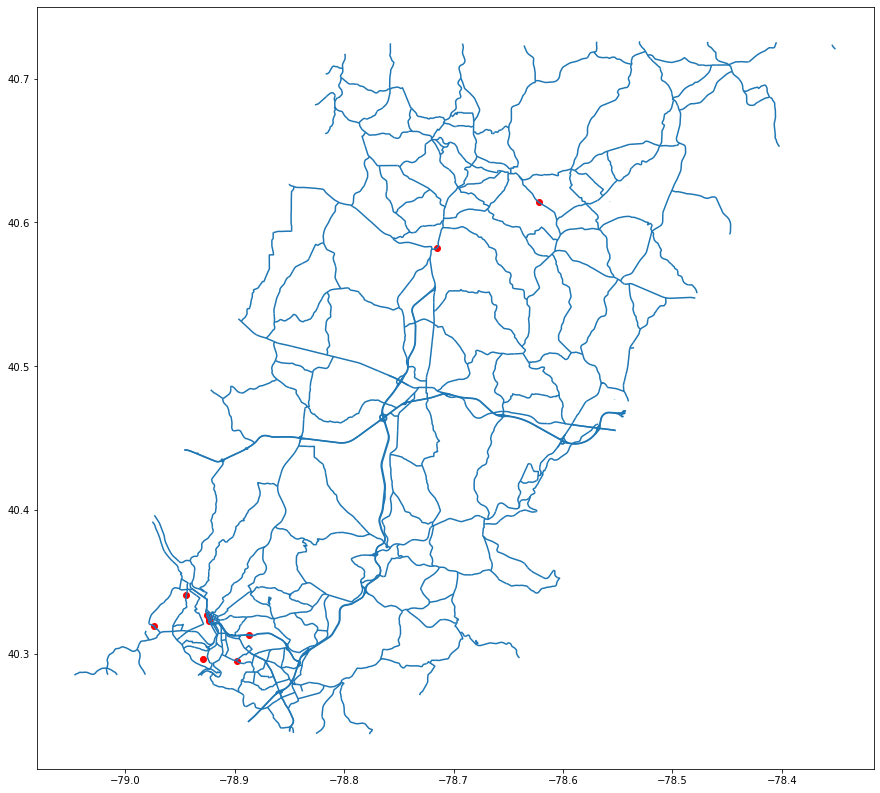

In [19]:
fig, ax = plt.subplots(figsize = (15,15))

#plot of road shapefile in Cambria County
roads_shp[roads_shp['CTY_CODE'].str.contains('11')].plot(ax=ax)

#plot of all locations within Cambria County
geo_df['geometry'].plot(ax=ax, c='red')

In [20]:
#list of columns in df about driver age
pop_list = df.filter(like='DRIVER').columns

ma=roads_shp[roads_shp['CTY_CODE'].str.contains('11')].explore(highlight=False, color='purple', tooltip=['ST_RT_NO', 'SPEED_LIMI'])
geo_df.explore(m=ma, color='red', popup=True, tooltip=[pop_list[0], pop_list[1], pop_list[2], pop_list[3], pop_list[4], pop_list[5], pop_list[6], pop_list[7]])

ma
# docs for explore(): https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.explore.html

From above map, it is shown that the majority of work zone accidents occur in the more densly populated areas

Question 2: Where in Pennsylvania do the most work zone vehicle accidents occur?

In [21]:
# Filter down to show work zone accidents
# Work Zone Ind is string (Y/N)
df2 = data_raw[(data_raw['WORK_ZONE_IND'].str.contains('Y'))]
df2.shape
#shows 1415 accidents in work zones in Pennsylvania

(1415, 99)

In [22]:
#create shapely point object to get a geometry column for geodataframe
x2 = zip(df2['DEC_LONG'], df2['DEC_LAT'])
geometry2 = [Point(xy) for xy in x2]

In [23]:
#create geodf for work zone accidents
geo_df2 = gpd.GeoDataFrame(df2, crs = crs, geometry = geometry2)

In [24]:
geo_df2.isnull().any().sort_values()

ARRIVAL_TM            False
ROAD_CONDITION        False
RELATION_TO_ROAD      False
POSSIBLE_INJ_COUNT    False
POLICE_AGCY           False
                      ...  
DEC_LONG               True
DEC_LAT                True
TFC_DETOUR_IND         True
WORK_ZONE_LOC          True
LATITUDE               True
Length: 100, dtype: bool

In [25]:
geo_df2 = geo_df2.fillna(value=0)

In [26]:
#need to delete any points that dont have a shapely point
geo_df2 = geo_df2.drop(geo_df2[geo_df2['DEC_LAT']==0].index)

In [27]:
geo_df2.shape
#7 points did not have latitude and longitude info

(1408, 100)

In [28]:
#plot of all work zone accidents in PA
ma2 = geo_df2.explore(color='red', popup=True, tooltip=True)
ma2

In [29]:
geo_df2.head()

,ARRIVAL_TM,AUTOMOBILE_COUNT,BELTED_DEATH_COUNT,BELTED_SUSP_SERIOUS_INJ_COUNT,BICYCLE_COUNT,BICYCLE_DEATH_COUNT,BICYCLE_SUSP_SERIOUS_INJ_COUNT,BUS_COUNT,CHLDPAS_DEATH_COUNT,CHLDPAS_SUSP_SERIOUS_INJ_COUNT,COLLISION_TYPE,COMM_VEH_COUNT,CONS_ZONE_SPD_LIM,COUNTY,CRASH_MONTH,CRASH_YEAR,CRN,DAY_OF_WEEK,DEC_LAT,DEC_LONG,DISPATCH_TM,DISTRICT,DRIVER_COUNT_16YR,DRIVER_COUNT_17YR,DRIVER_COUNT_18YR,DRIVER_COUNT_19YR,DRIVER_COUNT_20YR,DRIVER_COUNT_50_64YR,DRIVER_COUNT_65_74YR,DRIVER_COUNT_75PLUS,EST_HRS_CLOSED,FATAL_COUNT,HEAVY_TRUCK_COUNT,HORSE_BUGGY_COUNT,HOUR_OF_DAY,ILLUMINATION,INJURY_COUNT,INTERSECT_TYPE,LANE_CLOSED,LATITUDE,LN_CLOSE_DIR,LOCATION_TYPE,LONGITUDE,MAX_SEVERITY_LEVEL,MCYCLE_DEATH_COUNT,MCYCLE_SUSP_SERIOUS_INJ_COUNT,MOTORCYCLE_COUNT,MUNICIPALITY,NONMOTR_COUNT,NONMOTR_DEATH_COUNT,NONMOTR_SUSP_SERIOUS_INJ_COUNT,NTFY_HIWY_MAINT,PED_COUNT,PED_DEATH_COUNT,PED_SUSP_SERIOUS_INJ_COUNT,PERSON_COUNT,POLICE_AGCY,POSSIBLE_INJ_COUNT,RDWY_SURF_TYPE_CD,RELATION_TO_ROAD,ROAD_CONDITION,SCH_BUS_IND,SCH_ZONE_IND,SMALL_TRUCK_COUNT,SPEC_JURIS_CD,SUSP_MINOR_INJ_COUNT,SUSP_SERIOUS_INJ_COUNT,SUV_COUNT,TCD_FUNC_CD,TCD_TYPE,TFC_DETOUR_IND,TIME_OF_DAY,TOT_INJ_COUNT,TOTAL_UNITS,UNB_DEATH_COUNT,UNB_SUSP_SERIOUS_INJ_COUNT,UNBELTED_OCC_COUNT,UNK_INJ_DEG_COUNT,UNK_INJ_PER_COUNT,URBAN_RURAL,VAN_COUNT,VEHICLE_COUNT,WORK_ZONE_IND,WORK_ZONE_LOC,WORK_ZONE_TYPE,WORKERS_PRES,WZ_CLOSE_DETOUR,WZ_FLAGGER,WZ_LAW_OFFCR_IND,WZ_LN_CLOSURE,WZ_MOVING,WZ_OTHER,WZ_SHLDER_MDN,ROADWAY_CLEARED,WEATHER1,WEATHER2,WZ_WORKERS_INJ_KILLED,SECONDARY_CRASH,INTERSECTION_RELATED,geometry
209,1503.0,0,0,0,0,0,0,0,0,0,7,0,25.0,9,1,2020,2020000794,6,40.1174,-74.8460,1455.0,6,0,0,0,0,0,0,1,0,0.0,0,0,0.0,14.0,1,1,0,1,40 07:02.510,2.0,1,74 50:45.532,3,0,0,0,9101,0,0,0,Y,0,0,0,1,09101,0,0.0,4,9,N,N,0,0.0,1,0,1,0.0,0,N,1455.0,1,1,0,0,0,0,0,3,0,1,Y,4.0,1.0,N,0,0,N,0,Y,0,0,1530.0,07,,0,0,0,POINT (-74.84600 40.11740)
583,742.0,2,0,0,0,0,0,0,0,0,1,0,0.0,21,1,2020,2020001615,2,40.0473,-77.5278,734.0,8,0,0,0,0,0,0,0,0,0.0,0,0,0.0,7.0,1,1,0,1,40 02:50.175,3.0,0,77 31:40.187,4,0,0,0,21409,0,0,0,N,0,0,0,2,21409,1,0.0,1,1,N,N,0,0.0,0,0,0,0.0,0,N,734.0,1,2,0,0,0,0,0,2,0,2,Y,0.0,0.0,0,0,0,0,0,0,0,0,750.0,03,03,0,0,0,POINT (-77.52780 40.04730)
642,106.0,0,0,1,0,0,0,0,0,0,7,0,0.0,53,1,2020,2020001725,1,40.8139,-76.1240,103.0,5,0,0,0,0,0,1,0,0,0.0,0,0,0.0,0.0,2,1,0,1,40 48:49.900,6.0,0,76 07:26.300,2,0,0,0,53216,0,0,0,Y,0,0,0,1,53216,0,0.0,4,9,Y,Y,0,0.0,0,1,1,0.0,0,N,55.0,1,1,0,0,0,0,0,1,0,1,Y,0.0,0.0,0,0,0,0,0,0,0,0,130.0,03,03,0,0,0,POINT (-76.12400 40.81390)
710,1309.0,0,0,0,0,0,0,0,0,0,5,1,50.0,6,1,2020,2020001902,4,40.5779,-75.8129,1256.0,5,0,0,0,0,0,1,0,0,0.0,0,1,0.0,12.0,1,0,0,0,40 34:40.529,0.0,0,75 48:46.308,0,0,0,0,6215,0,0,0,N,0,0,0,1,68L04,0,0.0,2,1,N,N,0,0.0,0,0,0,0.0,0,0,1253.0,0,1,0,0,0,0,0,1,0,1,Y,3.0,1.0,N,0,0,N,0,0,Y,0,0.0,03,03,0,0,0,POINT (-75.81290 40.57790)
1286,830.0,0,0,0,0,0,0,0,0,0,7,0,99.0,67,1,2020,2020002928,5,39.9917,-75.2290,827.0,6,0,0,0,0,0,0,0,0,0.0,0,0,0.0,8.0,1,1,0,0,39 59:29.950,0.0,0,75 13:44.400,3,0,0,0,67301,0,0,0,N,0,0,0,2,67301,0,0.0,1,1,N,N,0,0.0,1,0,0,9.0,8,0,807.0,1,1,0,0,0,0,1,3,1,1,Y,4.0,2.0,N,0,0,N,Y,0,0,0,0.0,03,,0,0,0,POINT (-75.22900 39.99170)


<AxesSubplot:xlabel='COUNTY'>

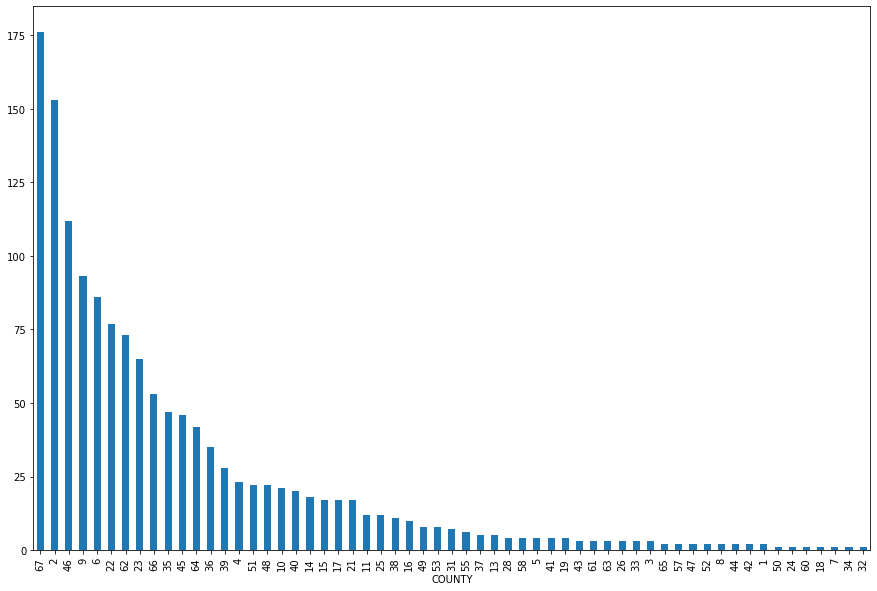

In [30]:
pd.set_option('display.max_rows', 10)

#aggregate count of all county's work zone accidents and sorted in descending order
x = geo_df2.groupby(by='COUNTY').count().sort_values(by='WORK_ZONE_IND', ascending = False)

#Create bar chart of county work zone accidents
x['WORK_ZONE_IND'].plot.bar(figsize=(15,10))

## Question 2 Answer:

Top 5 Counties for Work Zone Accidents:
1. 67 (Philadelphia County)
2. 2 (Allegheny County)
3. 46 (Montgomery County)
4. 9 (Bucks County)
5. 6 (Berks County)
    

In [31]:
#Explore Philadelphia County for further analysis

#counties = x['WORK_ZONE_IND'][0:5]

pop_list = df.filter(like='DRIVER').columns

#plot of roads in Philadelphia County
ma2=roads_shp[roads_shp['CTY_CODE'].str.contains('67')].explore(highlight=False, color='purple', tooltip=['ST_RT_NO', 'SPEED_LIMI'])

#plot of work zone accidents in Philadelphia County
geo_df2[geo_df2['COUNTY']==67].explore(m=ma2, color='red', popup=True, tooltip=[pop_list[0], pop_list[1], pop_list[2], pop_list[3], pop_list[4], pop_list[5], pop_list[6], pop_list[7]])

ma2